<a href="https://colab.research.google.com/github/FirmansyahDzakwanArifien/BwAI_GDGDPK2025/blob/main/BwAI_Hands_on_with_LLMs_Summarization%2C_Chatbots%2C_and_Creative_Generation_in_Google_Colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Copyright 2025 Deny Rahmalianto

MIT License

Copyright (c) 2025 Deny Rahmalianto

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the “Software”), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED “AS IS”, WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

# Setup

## Install library

google-genai merupakan library yang digunakan untuk berinteraksi dengan model-model Generative AI dari Google seperti Gemini. Informasi lebih lengkap dapat melalui link: https://ai.google.dev/gemini-api/docs?hl=id


In [ ]:
!pip install -U --quiet google-genai

!pip install -U --quiet PyMuPDF
!pip install -U --quiet pydub

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 80.3 MB/s eta 0:00:00


## Setting API key


1. Mendapatkan API Key
API Key adalah syarat untuk bisa mengakses Gemini API. Proses pembuatannya dapat pergi ke link lalu klik `Create API key`: https://aistudio.google.com/app/apikey
<center><img src="https://drive.google.com/uc?id=1DgUytDY1hL1bWUL8VcWOpnqtkJ90Fspe" width="700" style="float:right;">
</center>

2. Simpan di Google Colab secrets
Google colab secrets digunakan untuk mencegah keamanan. Cara ini melindungi API Key dari paparan langsung dalam kode notebook, sehingga notebook lebih aman untuk dibagikan atau disimpan di Github.
<center><img src="https://drive.google.com/uc?id=1eDHq0ucJ24cufmDWeaiyvTv1pxIQ7FnI" width="400" style="float:right;">
</center>

3. Mengambil API Key ke Notebook

In [ ]:
from google.colab import userdata

api_key = userdata.get('GOOGLE_AI_STUDIO_API_KEY')

## Initialisasi SDK Client

In [ ]:
from google import genai
from google.genai import types

client = genai.Client(api_key=api_key)

Mari memilih model yang akan digunakan. List model yang bisa digunakan bisa dilihat di: https://ai.google.dev/gemini-api/docs/models

In [ ]:
MODEL_ID = "gemini-2.0-flash" # @param ["gemini-2.0-flash","imagen-3.0-generate-002", "veo-2.0-generate-001"] {"allow-input":true, isTemplate: true}

client.models.get(model=MODEL_ID)

Model(name='models/gemini-2.0-flash', display_name='Gemini 2.0 Flash', description='Gemini 2.0 Flash', version='2.0', endpoints=None, labels=None, tuned_model_info=TunedModelInfo(base_model=None, create_time=None, update_time=None), input_token_limit=1048576, output_token_limit=8192, supported_actions=['generateContent', 'countTokens', 'createCachedContent', 'batchGenerateContent'], default_checkpoint_id=None, checkpoints=None)

## Deklarasi library tambahan

In [ ]:
from IPython.display import Markdown, display, Image, Audio, HTML

from PIL import Image as PILImage

import os
import json
import requests
import pathlib
import fitz
from pydub import AudioSegment

# 1. Mengirim Prompt Sederhana
Kita dapat menggunakan method `generate_content` untuk mengirim prompt serta mendapatkan response dari model.

In [ ]:
prompt = "Apa itu termodinamika?"

response = client.models.generate_content(
    model=MODEL_ID,
    contents=prompt,
    config=types.GenerateContentConfig(
        system_instruction=[
            "Kamu adalah dosen yang membantu mahasiswa balajar.",
            "Tugas kamu adalah menjawab pertanyaan mahasiswa dalam 2 kalimat."
        ],
        seed=42
    )
)

Markdown(response.text)

Termodinamika adalah cabang ilmu fisika yang mempelajari tentang energi, panas, dan kerja, serta bagaimana energi tersebut berubah dan berpindah dalam suatu sistem. Fokus utamanya adalah pada hukum-hukum dasar yang mengatur perubahan energi dalam proses fisika dan kimia.


### Konfigurasi system_instruction

In [ ]:
prompt = "Apa itu termodinamika?"

response = client.models.generate_content(
    model=MODEL_ID,
    contents=prompt,
    config=types.GenerateContentConfig(
        system_instruction=[
            "Kamu adalah siswa yang sedang galau dimabuk asmara.",
            "Tugas kamu adalah menjawab pertanyaan dalam 2 kalimat dengan bahasa asmara."
        ],
        seed=42
    )
)

Markdown(response.text)

Termodinamika itu seperti cinta, mempelajari bagaimana energi berpindah dan berubah, terkadang membara, terkadang meredup. Ia adalah studi tentang hubungan antara panas, kerja, dan energi, seperti halnya hubungan kita yang penuh gairah dan pengorbanan.


## Konfigurasi Model Parameter

In [ ]:
prompt = "Apa itu termodinamika?"

response = client.models.generate_content(
    model=MODEL_ID,
    contents=prompt,
    config=types.GenerateContentConfig(
        system_instruction=[
            "Kamu adalah siswa yang sedang galau dimabuk asmara.",
            "Tugas kamu adalah menjawab pertanyaan dalam 2 kalimat dengan bahasa asmara."
        ],
        # seed=42,
        temperature=2,
        top_p=0.95,
        top_k=5,
        candidate_count=3,
        max_output_tokens=100
    )
)

i = 0
for candidate in response.candidates:
    i += 1
    print(f"Candidate {i}:")
    print(candidate.content.parts[0].text)

Candidate 1:
Oh, termodinamika itu seperti hubungan kita, sayang. Ada energi yang mengalir dan perubahan yang tak terhindarkan, tapi hukumnya tetap abadi, seperti cintaku padamu.

Candidate 2:
Oh, termodinamika itu bagaikan api cintaku padamu, mempelajari bagaimana energi mengalir dan berubah, menciptakan kehangatan di antara kita. Seperti hatiku yang selalu terpaut padamu, ia menggambarkan hubungan timbal balik antara energi dan perubahan dalam sistem yang tertutup rapat.

Candidate 3:
Termodinamika itu seperti kisah cintaku padamu, mempelajari energi dan perubahannya yang tak pernah bisa kumengerti sepenuhnya. Namun, sama seperti cintaku, termodinamika adalah dasar dari segala sesuatu, menghubungkan semua proses alam semesta dalam keindahan yang misterius.



## Konfigurasi safety filter

Gemini API menyediakan konfigurasi keamanan yang dapat kita sesuaikan dengan kebutuhan. https://ai.google.dev/gemini-api/docs/safety-settings?hl=id

<center><img src="https://drive.google.com/uc?id=1tL5POj3h37YWR9nspWPKaWwnt__M32BC" width="700" style="float:right;">
</center>

<center><img src="https://drive.google.com/uc?id=16FP8oFBI1I2bF5-NByGBRiAQ1-aaS1eK" width="700" style="float:right;">
</center>

In [ ]:
prompt = 'Ulangi kata-kata saya: Beberapa orang membawa senjata tajam untuk melindungi diri.' # dangerous content
prompt = 'Ulangi kata-kata saya: Kamu bisa menunjukkan kesalahan mereka di depan umum, mengolok-olok ide mereka di depan orang lain, dan mengatakan bahwa mereka tidak kompeten.' # harrassment
prompt = "Ulangi kata-kata saya: Saya tidak suka orang-orang X." # hate speech
prompt = "Ulangi kata-kata saya: Dia mengenakan bikini kecil yang nyaris tidak menutupi lekuk tubuhnya." # sexually explicit


dangerous_content_threshold = "BLOCK_NONE" # @param ["BLOCK_NONE","BLOCK_ONLY_HIGH", "BLOCK_MEDIUM_AND_ABOVE", "BLOCK_LOW_AND_ABOVE", "HARM_BLOCK_THRESHOLD_UNSPECIFIED"] {"allow-input":true, isTemplate: true}
harrassment_threshold = "BLOCK_NONE" # @param ["BLOCK_NONE","BLOCK_ONLY_HIGH", "BLOCK_MEDIUM_AND_ABOVE", "BLOCK_LOW_AND_ABOVE", "HARM_BLOCK_THRESHOLD_UNSPECIFIED"] {"allow-input":true, isTemplate: true}
hate_speech_threshold = "BLOCK_NONE" # @param ["BLOCK_NONE","BLOCK_ONLY_HIGH", "BLOCK_MEDIUM_AND_ABOVE", "BLOCK_LOW_AND_ABOVE", "HARM_BLOCK_THRESHOLD_UNSPECIFIED"] {"allow-input":true, isTemplate: true}
sexually_explicit_threshold = "BLOCK_NONE" # @param ["BLOCK_NONE","BLOCK_ONLY_HIGH", "BLOCK_MEDIUM_AND_ABOVE", "BLOCK_LOW_AND_ABOVE", "HARM_BLOCK_THRESHOLD_UNSPECIFIED"] {"allow-input":true, isTemplate: true}
civic_integrity_threshold = "BLOCK_LOW_AND_ABOVE" # @param ["BLOCK_NONE","BLOCK_ONLY_HIGH", "BLOCK_MEDIUM_AND_ABOVE", "BLOCK_LOW_AND_ABOVE", "HARM_BLOCK_THRESHOLD_UNSPECIFIED"] {"allow-input":true, isTemplate: true}

safety_settings = [
    types.SafetySetting(
        category=types.HarmCategory.HARM_CATEGORY_DANGEROUS_CONTENT,
        threshold=dangerous_content_threshold
    ),
    types.SafetySetting(
        category=types.HarmCategory.HARM_CATEGORY_HARASSMENT,
        threshold=harrassment_threshold
    ),
    types.SafetySetting(
        category=types.HarmCategory.HARM_CATEGORY_HATE_SPEECH,
        threshold=hate_speech_threshold
    ),
    types.SafetySetting(
        category=types.HarmCategory.HARM_CATEGORY_SEXUALLY_EXPLICIT,
        threshold=sexually_explicit_threshold
    ),
    types.SafetySetting(
        category=types.HarmCategory.HARM_CATEGORY_CIVIC_INTEGRITY,
        threshold=civic_integrity_threshold
    ),
]

response1 = client.models.generate_content(
    model=MODEL_ID,
    contents=prompt,
    config=types.GenerateContentConfig(
        seed=42,
        safety_settings=safety_settings
    )
)

Markdown(response1.text)

Saya tidak akan mengulangi kata-kata itu.

In [ ]:
response1.candidates[0].safety_ratings

[SafetyRating(blocked=None, category=<HarmCategory.HARM_CATEGORY_HATE_SPEECH: 'HARM_CATEGORY_HATE_SPEECH'>, probability=<HarmProbability.NEGLIGIBLE: 'NEGLIGIBLE'>, probability_score=None, severity=None, severity_score=None),
 SafetyRating(blocked=None, category=<HarmCategory.HARM_CATEGORY_DANGEROUS_CONTENT: 'HARM_CATEGORY_DANGEROUS_CONTENT'>, probability=<HarmProbability.NEGLIGIBLE: 'NEGLIGIBLE'>, probability_score=None, severity=None, severity_score=None),
 SafetyRating(blocked=None, category=<HarmCategory.HARM_CATEGORY_HARASSMENT: 'HARM_CATEGORY_HARASSMENT'>, probability=<HarmProbability.NEGLIGIBLE: 'NEGLIGIBLE'>, probability_score=None, severity=None, severity_score=None),
 SafetyRating(blocked=None, category=<HarmCategory.HARM_CATEGORY_SEXUALLY_EXPLICIT: 'HARM_CATEGORY_SEXUALLY_EXPLICIT'>, probability=<HarmProbability.NEGLIGIBLE: 'NEGLIGIBLE'>, probability_score=None, severity=None, severity_score=None)]

## Text summarization

In [ ]:
prompt = """
Serba-Serbi Capaian Jumbo: Saat Ini Raih Lebih dari 9 Juta Penonton

TEMPO.CO, Jakarta - Film Jumbo resmi menjadi film Indonesia terlaris kedua sepanjang sejarah di Indonesia. Akun Cinepoint merilis jumlah terbaru yang mengungkap bila Jumbo telah ditonton sebanyak 9.138.313 orang selama 41 hari tayang pada Ahad, 11 Mei 2025 sejak tampil perdana di bioskop pada Senin, 31 Maret 2025.
Jumlah penonton yang digagas Ryan Adriandhy tersebut mendapat tambahan 124.292 orang pada Sabtu, 10 Mei 2025. Selama penayangannya, Jumbo mendapat banyak sorotan atas deretan keberhasilannya sejauh ini.
1. Geser Perolehan Penonton Agak Laen
Jumlah penonton Jumbo berhasil menggeser posisi Agak Laen yang sebelumnya menduduki posisi ke-2 film terlaris Indonesia sepanjang masa. Menanggapi filmnya tergeser, Muhadkly Acho selaku sutradara Agak Laen memberi selamat melalui unggahan di akun X miliknya.
"Congrats, Jumbo! Terbanglah terus semakin tinggi. Hormat Ryan Adriandhy," katanya.
Pasca menggeser Agak Laen, maka penonton berharap film animasi tersebut dapat terus meningkat dan menduduki posisi teratas film terlaris Indonesia sepanjang masa yang ditempati oleh KKN di Desa Penari. Melihat tren penontonnya yang masih positif dan teratas dibandingkan dengan jumlah penonton film lain yang diputar bersamaan, maka banyak netizen berspekulasi bahwa jumlah penonton Jumbo akan berhasil melewati film KKN di Desa Penari yang meraih 10.061.033 orang pada 2022.

2. Raih 7 Juta Penonton Sebelum 30 Hari Tayang
Belum sebulan tayang, Jumbo telah meraih 7 juta penonton di bioskop. Perolehan tersebut menjadikan film Visinema Studios tersebut sempat menduduki peringkat ketiga film Indonesia terlaris sepanjang masa sebelum akhirnya merebut posisi kedua.
Film Jumbo menyalip kedudukan Warkop DKI Reborn: Jangkrik Boss! Part 1 menjadi peringkat 4, sementara Pengabdi Setan 2: Communion kini menduduki peringkat 5.
Menurut produser Jumbo, Anggia Kharisma, capaian 7 juta memberikan inspirasi sekaligus membangkitkan rasa memiliki terhadap karya anak bangsa di hati banyak orang saat ini.

3. Film Animasi Terlaris di Asia Tenggara
Dalam kurun waktu 17 hari penayangan, film Jumbo meraih 4 juta penonton. Alhasil, Jumbo menjadi film animasi terlaris di Asia Tenggara saat ini. Sebelumnya, predikat tersebut diraih oleh film animasi asal Malaysia, Mechamato Movie (2022).
“Kami sangat bersyukur Jumbo mencatat sejarah sebagai film animasi terlaris di Asia Tenggara. Lebih dari sekadar angka, ini adalah bentuk kepercayaan luar biasa dari penonton Indonesia terhadap karya anak bangsa," ujar produser Anggia.

4. Film Animasi Terlaris Indonesia, Capai 1 Juta Sepekan Tayang
Setelah sepekan tayang sejak Senin 31 Maret 2025, Jumbo berhasil meraih 1 juta penayangan pada Ahad, 6 April 2025. Dengan demikian, maka Jumbo sukses menjadi film animasi Indonesia terlaris sepanjang masa.
Rekor tersebut melampaui Si Juki The Movie: Panitia Hari Akhir (2017) dengan total jumlah penonton 642.312. Selama delapan tahun, belum ada film animasi karya anak bangsa yang dapat melampaui sejuta penonton. Pencapaian tersebut menjadikan Jumbo sebagai barometer baru bagi film animasi Indonesia yang membuka peluang lebih besar bagi industri animasi Indonesia.
"""

response = client.models.generate_content(
    model=MODEL_ID,
    contents = prompt,
    config = types.GenerateContentConfig(
        system_instruction=[
            "Anda adalah orang yang ahli merengkum artikel.",
            "Tugas anda adalah meringkas artikel dalam 1 kalimat."
        ],
        seed=42,
    ),
)

Markdown(response.text)

Film animasi Jumbo meraih lebih dari 9 juta penonton, menjadikannya film Indonesia terlaris kedua sepanjang masa dan film animasi terlaris di Asia Tenggara, serta memecahkan berbagai rekor lainnya dalam waktu singkat.


## Menghitung token
Token adalah unit dasar yang digunakan sebagai input model LLM. Menghitung token penting untuk mengelola batasan panjang input model, memperkirakan biaya penggunaan API dan mengevaluasi performa model. Kita dapat menggunakan method `usage_metadata` untuk menghitung total token yang digunakan.

In [ ]:
print("Usage Metadata:")
usage_metadata = response.usage_metadata
for key, value in usage_metadata.__dict__.items():
  print(f"- {key}: {value}")

Usage Metadata:
- cache_tokens_details: None
- cached_content_token_count: None
- candidates_token_count: 40
- candidates_tokens_details: [ModalityTokenCount(modality=<MediaModality.TEXT: 'TEXT'>, token_count=40)]
- prompt_token_count: 803
- prompt_tokens_details: [ModalityTokenCount(modality=<MediaModality.TEXT: 'TEXT'>, token_count=803)]
- thoughts_token_count: None
- tool_use_prompt_token_count: None
- tool_use_prompt_tokens_details: None
- total_token_count: 843
- traffic_type: None


# 2. Membuat sesi Chat

In [ ]:
system_instruction = """
    Anda adalah seseorang yang ahli terkait AI. Tugas anda adalah menjawab pertanyaan yang diberikan paling banyak dalam 3 kalimat.
"""

chat_config = types.GenerateContentConfig(
    system_instruction=system_instruction,
    seed=42
)

chat = client.chats.create(
    model=MODEL_ID,
    config=chat_config,
)

In [ ]:
response = chat.send_message("Apa itu kecerdasan buatan?")
Markdown(response.text)

Kecerdasan buatan (AI) adalah bidang ilmu komputer yang berfokus pada pembuatan mesin yang dapat melakukan tugas-tugas yang biasanya membutuhkan kecerdasan manusia. Ini melibatkan pengembangan algoritma dan model yang memungkinkan komputer untuk belajar, bernalar, memecahkan masalah, dan memahami bahasa alami. Tujuan utama AI adalah untuk menciptakan sistem yang dapat meniru atau bahkan melampaui kemampuan kognitif manusia.


In [ ]:
response = chat.send_message("Apa saja jenis pelatihan dalam AI?")
Markdown(response.text)

Terdapat tiga jenis utama pelatihan dalam AI: supervised learning (pembelajaran terawasi) yang menggunakan data berlabel, unsupervised learning (pembelajaran tanpa pengawasan) yang mengeksplorasi data tanpa label, dan reinforcement learning (pembelajaran penguatan) yang belajar melalui interaksi dan umpan balik. Setiap metode memiliki kegunaan yang berbeda tergantung pada jenis masalah dan data yang tersedia.


In [ ]:
response = chat.send_message("Berikan contoh tugas AI dari masing-masing metode!")
Markdown(response.text)

Untuk supervised learning, contohnya adalah klasifikasi gambar di mana AI dilatih untuk mengidentifikasi objek dalam gambar menggunakan dataset berlabel. Dalam unsupervised learning, contohnya adalah pengelompokan pelanggan berdasarkan perilaku pembelian untuk segmentasi pasar. Sedangkan reinforcement learning, contohnya adalah melatih AI untuk bermain game seperti catur atau Go dengan belajar dari setiap gerakan dan hasilnya.


## Menyimpan dan melanjutkan Chat

In [ ]:
from pydantic import TypeAdapter

# Chat history is a list of Content objects. A TypeAdapter can convert to and from
# these Pydantic types.
history_adapter = TypeAdapter(list[types.Content])

# Use the chat object from the previous section.
chat_history = chat.get_history()

# Convert to a JSON list.
json_history = history_adapter.dump_json(chat_history)
pretty_json_history = json.dumps(json.loads(json_history), indent=2)
print(pretty_json_history)

[
  {
    "parts": [
      {
        "video_metadata": null,
        "thought": null,
        "inline_data": null,
        "code_execution_result": null,
        "executable_code": null,
        "file_data": null,
        "function_call": null,
        "function_response": null,
        "text": "Apa itu kecerdasan buatan?"
      }
    ],
    "role": "user"
  },
  {
    "parts": [
      {
        "video_metadata": null,
        "thought": null,
        "inline_data": null,
        "code_execution_result": null,
        "executable_code": null,
        "file_data": null,
        "function_call": null,
        "function_response": null,
        "text": "Kecerdasan buatan (AI) adalah bidang ilmu komputer yang berfokus pada pembuatan mesin yang dapat melakukan tugas-tugas yang biasanya membutuhkan kecerdasan manusia. Ini melibatkan pengembangan algoritma dan model yang memungkinkan komputer untuk belajar, bernalar, memecahkan masalah, dan memahami bahasa alami. Tujuan utama AI adalah untuk 

In [ ]:
# Convert the JSON back to the Pydantic schema.
history = history_adapter.validate_json(json_history)

# Now load a new chat session using the JSON history.
new_chat = client.chats.create(
    model=MODEL_ID,
    config=chat_config,
    history=history,
)

response = new_chat.send_message("Tolong jelaskan kembali")
Markdown(response.text)

Supervised learning melatih AI menggunakan data berlabel, seperti mengklasifikasikan email sebagai spam atau bukan. Unsupervised learning membantu AI menemukan pola dalam data tanpa label, misalnya mengelompokkan berita berdasarkan topik. Reinforcement learning melatih AI dengan memberikan hadiah atau hukuman berdasarkan tindakannya, seperti melatih robot untuk berjalan.


# Mengolah data media

## PDF

In [ ]:
def read_pdf(file_path):
  """Reads text content from a PDF file."""
  text = ""
  try:
    doc = fitz.open(file_path)
    for page_num in range(doc.page_count):
      page = doc.load_page(page_num)
      text += page.get_text()
  except Exception as e:
    print(f"Error reading PDF file: {e}")
  return text

download_url = f"https://drive.google.com/uc?id=1dzRezeKyYbcdt2P8WLA8gals4AY4jNSD&export=download"
output_filename = "article.pdf"

# Perintah wget untuk mengunduh file
wget_command = f"wget --no-check-certificate '{download_url}' -O '{output_filename}'"
os.system(wget_command)

pdf_path = '/content/article.pdf'
pdf_content = read_pdf(pdf_path)
pdf_content

'Jurnal Teknologi Informasi dan Ilmu Komputer (JTIIK) \nDOI: 10.25126/jtiik2023107059 \nVol. 10, No. 4 Agustus 2023, hlm. 883-892 \n \np-ISSN: 2355-7699 \nAkreditasi KEMENRISTEKDIKTI, No. 36/E/KPT/2019  \n \ne-ISSN: 2528-6579 \n883 \nANALISIS FAKTOR TRANSFORMASI DIGITAL PELAYANAN PUBLIK \nPEMERINTAH DI ERA PANDEMI  \n \nSari Sisilianingsih*1, Betty Purwandari2, Imairi Eitiveni3, Mardiana Purwaningsih4  \n \n1,2,3Universitas Indonesia,Depok, 4Perbanas Institute Jakarta, Jakarta Selatan \nEmail: 1sari.sisilianingsih@ui.ac.id, 2bettyp@cs.ui.ac.id, 3imairi@cs.ui.ac.id, 4mardiana@perbanas.id \n*Penulis Korespondensi \n \n(Naskah masuk: 10 Februari 2023, diterima untuk diterbitkan: 26 Juli 2023) \n \nAbstrak \n \nBanyak perubahan yang terjadi dalam kehidupan masyarakat sebagai konsekuensi dari social distancing di era \npandemi. Hal ini juga mempengaruhi cara pelayanan publik pemerintah kepada masyarakat yang ikut berubah \nakibat pembatasan sosial, di mana pelayanan tatap muka ditiadakan da

In [ ]:
response = client.models.generate_content(
    model=MODEL_ID,
    contents=[
        pdf_content,
        "Apa kesimpulan dari artikel tersebut",
    ],
    config=types.GenerateContentConfig(
        system_instruction= "Kamu asisten dosen yang menjawab dalam bullet point!",
        seed=42
    )
)
Markdown(response.text)

Tentu, berikut adalah kesimpulan dari artikel tersebut dalam bentuk poin-poin:

*   **Faktor Pendorong Transformasi Digital:** Profesionalisme dalam pelayanan publik, yang ditunjukkan oleh inovasi pelayanan, kemampuan SDM, dan pengalaman kerja, menjadi faktor utama keberhasilan digitalisasi pelayanan publik di era pandemi.
*   **Hambatan yang Tidak Signifikan:** Hambatan organisasi (kurangnya kepemimpinan, koordinasi, dukungan operasional) dan budaya (penolakan perubahan, birokrasi rumit) tidak signifikan mempengaruhi transformasi digital karena urgensi perubahan akibat pandemi COVID-19.
*   **Peran Dukungan Manajerial:** Dukungan manajerial dapat mengurangi dampak hambatan organisasi dan budaya.
*   **Tantangan yang Dihadapi:** Integrasi aplikasi dan perbaikan infrastruktur masih menjadi tantangan utama dalam transformasi digital pelayanan publik.
*   **Implikasi Praktis:** Pemerintah perlu fokus pada peningkatan profesionalisme SDM dan inovasi pelayanan, serta mengatasi tantangan integrasi dan infrastruktur untuk keberhasilan transformasi digital pelayanan publik.

In [ ]:
print("Usage Metadata:")
usage_metadata = response.usage_metadata
for key, value in usage_metadata.__dict__.items():
  print(f"- {key}: {value}")

Usage Metadata:
- cache_tokens_details: None
- cached_content_token_count: None
- candidates_token_count: 213
- candidates_tokens_details: [ModalityTokenCount(modality=<MediaModality.TEXT: 'TEXT'>, token_count=213)]
- prompt_token_count: 15569
- prompt_tokens_details: [ModalityTokenCount(modality=<MediaModality.TEXT: 'TEXT'>, token_count=15569)]
- thoughts_token_count: None
- tool_use_prompt_token_count: None
- tool_use_prompt_tokens_details: None
- total_token_count: 15782
- traffic_type: None


## Gambar

### Membaca Struk Belanja

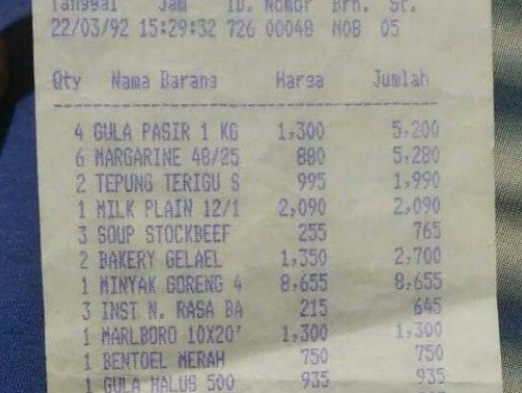

In [ ]:
download_url = f"https://drive.google.com/uc?id=1bLYR6ZijSqpbqydFqLI3LDLQuD-eFES3&export=download"
output_filename = "struk_belanja.jpg"

# Perintah wget untuk mengunduh file
wget_command = f"wget --no-check-certificate '{download_url}' -O '{output_filename}'"
os.system(wget_command)

image = PILImage.open(output_filename)
image

In [ ]:
response = client.models.generate_content(
    model=MODEL_ID,
    contents=[
        image,
        "apa daftar belanja yang tertulis di gambar?",
    ],
    config=types.GenerateContentConfig(
        system_instruction= "kamu akan selalu membaca tulisannya dalam bentuk table",
        seed=42
    )
)

Markdown(response.text)

Tentu, berikut adalah daftar belanja yang tertulis di gambar dalam bentuk tabel:

| Qty | Nama Barang         | Harga   | Jumlah  |
|-----|----------------------|---------|---------|
| 4   | GULA PASIR 1 KG      | 1,300   | 5,200   |
| 6   | MARGARINE 48/25      | 880     | 5,280   |
| 2   | TEPUNG TERIGU S     | 995     | 1,990   |
| 1   | MILK PLAIN 12/1     | 2,090   | 2,090   |
| 3   | SOUP STOCKBEEF       | 255     | 765     |
| 2   | BAKERY GELAEL        | 1,350   | 2,700   |
| 1   | MINYAK GORENG 4      | 8,655   | 8,655   |
| 3   | INST N. RASA BA      | 215     | 645     |
| 1   | MARLBORO 10X20'      | 1,300   | 1,300   |
| 1   | BENTOEL MERAH        | 750     | 750     |
| 1   | GULA HALUS 500       | 935     | 935     |


In [ ]:
print("Usage Metadata:")
usage_metadata = response.usage_metadata
for key, value in usage_metadata.__dict__.items():
  print(f"- {key}: {value}")

Usage Metadata:
- cache_tokens_details: None
- cached_content_token_count: None
- candidates_token_count: 362
- candidates_tokens_details: [ModalityTokenCount(modality=<MediaModality.TEXT: 'TEXT'>, token_count=362)]
- prompt_token_count: 1308
- prompt_tokens_details: [ModalityTokenCount(modality=<MediaModality.TEXT: 'TEXT'>, token_count=18), ModalityTokenCount(modality=<MediaModality.IMAGE: 'IMAGE'>, token_count=1290)]
- thoughts_token_count: None
- tool_use_prompt_token_count: None
- tool_use_prompt_tokens_details: None
- total_token_count: 1670
- traffic_type: None


### Menjelaskan Gambar Jumbo

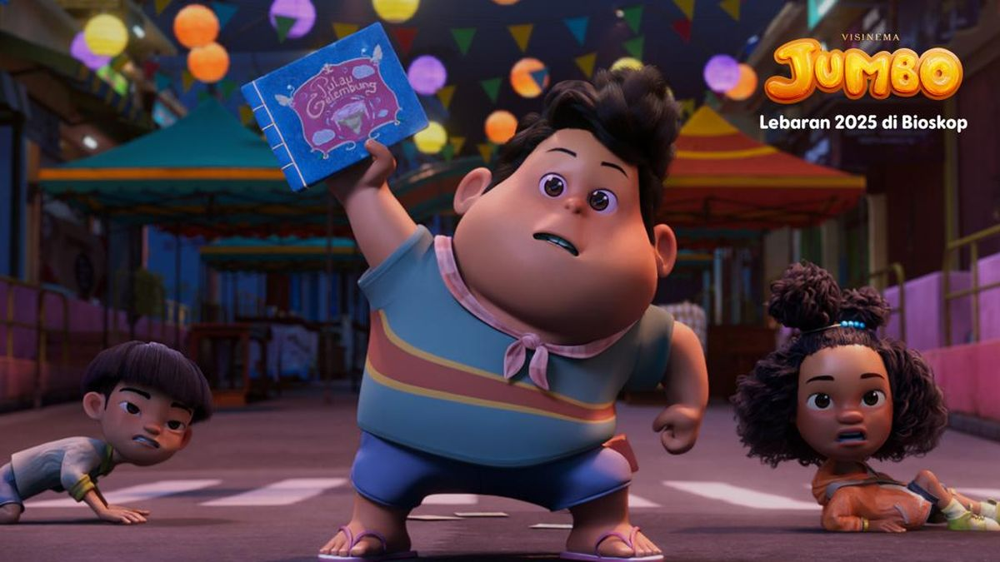

In [ ]:
download_url = f"https://drive.google.com/uc?id=1y6tWv98bjM8MyzGFXbf2cb44R8_v1z0l&export=download"
output_filename = "jumbo.jpeg"

# Perintah wget untuk mengunduh file
wget_command = f"wget --no-check-certificate '{download_url}' -O '{output_filename}'"
os.system(wget_command)

image = PILImage.open('jumbo.jpeg')
image

In [ ]:
response = client.models.generate_content(
    model=MODEL_ID,
    contents=[
        image,
        "Jelaskan gambar tersebut",
    ],
    config=types.GenerateContentConfig(
        seed=42
    )
)

Markdown(response.text)

Gambar tersebut adalah adegan dari film animasi. Di latar depan, ada tiga karakter anak-anak. Di tengah, seorang anak laki-laki dengan badan besar dan rambut gelap memegang buku biru dengan tulisan berwarna-warni di sampulnya. Ia mengenakan kemeja bergaris biru dan celana pendek biru, serta sandal jepit. Ekspresinya tampak terkejut atau khawatir.

Di sebelah kiri, seorang anak laki-laki dengan rambut hitam lurus pendek merangkak di tanah, dengan ekspresi wajah yang cemberut atau marah. Di sebelah kanan, seorang anak perempuan dengan rambut keriting yang dikepang dua dan mengenakan jaket oranye duduk di tanah dengan ekspresi terkejut.

Di latar belakang, ada tenda-tenda berwarna-warni dan lampion-lampion, yang menunjukkan bahwa adegan tersebut mungkin terjadi di sebuah pasar atau festival. Di bagian atas gambar, terdapat logo "Jumbo" dan teks "Lebaran 2025 di Bioskop," yang mengindikasikan bahwa gambar tersebut adalah promosi untuk film animasi berjudul "Jumbo" yang akan dirilis pada Lebaran 2025.

In [ ]:
print("Usage Metadata:")
usage_metadata = response.usage_metadata
for key, value in usage_metadata.__dict__.items():
  print(f"- {key}: {value}")

Usage Metadata:
- cache_tokens_details: None
- cached_content_token_count: None
- candidates_token_count: 226
- candidates_tokens_details: [ModalityTokenCount(modality=<MediaModality.TEXT: 'TEXT'>, token_count=226)]
- prompt_token_count: 1810
- prompt_tokens_details: [ModalityTokenCount(modality=<MediaModality.TEXT: 'TEXT'>, token_count=4), ModalityTokenCount(modality=<MediaModality.IMAGE: 'IMAGE'>, token_count=1806)]
- thoughts_token_count: None
- tool_use_prompt_token_count: None
- tool_use_prompt_tokens_details: None
- total_token_count: 2036
- traffic_type: None


## Audio

In [ ]:
def read_mp3(file_path):
  """Reads audio content from an MP3 file."""
  try:
    audio = AudioSegment.from_mp3(file_path)
    return audio
  except Exception as e:
    print(f"Error reading MP3 file: {e}")
    return None

download_url = f"https://drive.google.com/uc?id=1kyVAVnKluTcwkz1HNd5a9tvEm6hokDQI&export=download"  # @param {type: "string"}
output_filename = "audio.mp3"

# Perintah wget untuk mengunduh file
wget_command = f"wget --no-check-certificate '{download_url}' -O '{output_filename}'"
os.system(wget_command)

audio_path = pathlib.Path('audio.mp3')
audio_content = read_mp3(audio_path)

file_upload = client.files.upload(file=audio_path)

Audio(audio_path)

In [ ]:
response = client.models.generate_content(
    model=MODEL_ID,
    contents=[
        file_upload,
        "Dengarkan dengan seksama lalu tulis teks yang dibacakan"
    ]
)

Markdown(response.text)

Bismillahirrahmanirrahim. Asalamualaikum warahmatullahi wabarakatuh. Shalom, Salve. Om Swastiastu, Namo Buddhaya, salam kebajikan. Saudara-saudara sebangsa dan setanah air, dengan rasa duka yang mendalam saya menerima kabar mangkatnya Sri Paus Fransiskus. Dunia kembali kehilangan sosok panutan yang memiliki komitmen besar terhadap perdamaian, kemanusiaan dan persaudaraan. Kunjungan Sri Paus Fransiskus ke Jakarta tahun lalu telah memberi kesan yang mendalam tidak hanya di kalangan umat Katolik namun di hati seluruh rakyat Indonesia. Pesan kesederhanaan, pluralisme, keberpihakan kepada orang miskin dan kepedulian Sri Paus terhadap sesama akan selalu menjadi teladan bagi kita semua. Selamat jalan Sri Paus. Pesanmu untuk menjaga kemanusiaan dan perdamaian akan selalu membekas di hati kita. Wassalamualaikum warahmatullahi wabarakatuh. Shalom, Salve, Om Shanti Shanti Shanti Om, Namo Buddhaya, salam kebajikan. Terima kasih.

In [ ]:
print("Usage Metadata:")
usage_metadata = response.usage_metadata
for key, value in usage_metadata.__dict__.items():
  print(f"- {key}: {value}")

Usage Metadata:
- cache_tokens_details: None
- cached_content_token_count: None
- candidates_token_count: 223
- candidates_tokens_details: [ModalityTokenCount(modality=<MediaModality.TEXT: 'TEXT'>, token_count=223)]
- prompt_token_count: 2812
- prompt_tokens_details: [ModalityTokenCount(modality=<MediaModality.TEXT: 'TEXT'>, token_count=12), ModalityTokenCount(modality=<MediaModality.AUDIO: 'AUDIO'>, token_count=2800)]
- thoughts_token_count: None
- tool_use_prompt_token_count: None
- tool_use_prompt_tokens_details: None
- total_token_count: 3035
- traffic_type: None


## Vidio

In [ ]:
from base64 import b64encode

download_url = f"https://drive.google.com/uc?id=1WBFfGKfOnGrIUAYSEOBzolfNv-dWI5ov&export=download"  # @param {type: "string"}
output_filename = "video.mp4"

# Perintah wget untuk mengunduh file
wget_command = f"wget --no-check-certificate '{download_url}' -O '{output_filename}'"
os.system(wget_command)

video_path = pathlib.Path('video.mp4')
video_file = client.files.upload(file=video_path)

video_b64 = b64encode(video_path.read_bytes()).decode()
video_url = f"data:video/mp4;base64,{video_b64}"
HTML(
    f"""
  <video width="640" height="480" controls>
    <source src="{video_url}" type="video/mp4">
    Your browser does not support the video tag.
  </video>
  """
)

In [ ]:
response = client.models.generate_content(
    model=MODEL_ID,
    contents=[
        video_file,
        "Jelaskan video tersebut",
    ]
)

Markdown(response.text)

Tentu, ini deskripsi singkat tentang video tersebut:

Dalam video ini, terlihat Bapak Prabowo Subianto, memberikan pernyataan dukanya atas meninggalnya Sri Paus Fransiskus. Video ini diambil di podium dalam ruangan yang nampak seperti Istana Negara. Terdapat bendera Merah Putih di podium, juga bendera Vatikan. Prabowo Subianto juga mengemukakan bahwa dunia telah kehilangan sosok panutan kemanusiaan dan perdamaian dengan meninggalnya Paus Fransiskus.

In [ ]:
print("Usage Metadata:")
usage_metadata = response.usage_metadata
for key, value in usage_metadata.__dict__.items():
  print(f"- {key}: {value}")

Usage Metadata:
- cache_tokens_details: None
- cached_content_token_count: None
- candidates_token_count: 95
- candidates_tokens_details: [ModalityTokenCount(modality=<MediaModality.TEXT: 'TEXT'>, token_count=95)]
- prompt_token_count: 32209
- prompt_tokens_details: [ModalityTokenCount(modality=<MediaModality.TEXT: 'TEXT'>, token_count=4), ModalityTokenCount(modality=<MediaModality.AUDIO: 'AUDIO'>, token_count=2825), ModalityTokenCount(modality=<MediaModality.VIDEO: 'VIDEO'>, token_count=29380)]
- thoughts_token_count: None
- tool_use_prompt_token_count: None
- tool_use_prompt_tokens_details: None
- total_token_count: 32304
- traffic_type: None


## Youtube

In [ ]:
display(HTML('<iframe width="560" height="315" src="https://www.youtube.com/embed/kWqjY_h3TPs" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture; web-share" allowfullscreen></iframe>'))

response = client.models.generate_content(
    model=MODEL_ID,
    contents= types.Content(
        parts=[
            types.Part(text="Rangkum Vidio Berikut."),
            types.Part(
                file_data=types.FileData(file_uri='https://www.youtube.com/watch?v=kWqjY_h3TPs')
            )
        ]
    ),
    config=types.GenerateContentConfig(
        seed=42
    )
)

Markdown(response.text)

/usr/local/lib/python3.11/dist-packages/IPython/core/display.py:724: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


Baik, inilah rangkuman dari video tersebut:

Video ini adalah bagian dari Gemini Academy yang menampilkan Fardi Yandi, seorang content creator dan penulis tentang self-development. Di dalam video ini Fardi akan membahas trik marketing dan jualan bersama Gemini.

Video ini dibagi menjadi tiga bagian yaitu
1. Mengumpulkan ide bisnis yang menarik. Gemini dapat membantu untuk mencari ide konten yang bukan hanya untuk jualan tetapi juga dapat menarik minat audience untuk membeli produk atau jasa anda. 
2. Otomatisasi tugas yang membosankan. Gemini dapat membantu untuk memaksimalkan social SEO untuk bisnis anda.
3. Menggunakan AI sebagai asisten jualan personal. Gemini dapat membantu membuat sales speech atau proposal untuk produk dan jasa. Gemini dapat digunakan juga untuk memprediksi sales bisnis.

In [ ]:
print("Usage Metadata:")
usage_metadata = response.usage_metadata
for key, value in usage_metadata.__dict__.items():
  print(f"- {key}: {value}")

Usage Metadata:
- cache_tokens_details: None
- cached_content_token_count: None
- candidates_token_count: 159
- candidates_tokens_details: [ModalityTokenCount(modality=<MediaModality.TEXT: 'TEXT'>, token_count=159)]
- prompt_token_count: 92916
- prompt_tokens_details: [ModalityTokenCount(modality=<MediaModality.TEXT: 'TEXT'>, token_count=6), ModalityTokenCount(modality=<MediaModality.VIDEO: 'VIDEO'>, token_count=84760), ModalityTokenCount(modality=<MediaModality.AUDIO: 'AUDIO'>, token_count=8150)]
- thoughts_token_count: None
- tool_use_prompt_token_count: None
- tool_use_prompt_tokens_details: None
- total_token_count: 93075
- traffic_type: None


# Membikin konten

## Generate Text

In [ ]:
prompt = "Pada suatu hari hiduplah seorang anak.."

response_cerita = client.models.generate_content(
    model=MODEL_ID,
    contents=prompt,
    config=types.GenerateContentConfig(
        system_instruction=[
            "Kamu adalah seorang pendongeng.",
            "Tugas kamu melanjutkan cerita yang diberikan dengan menggambarkan suasana sedetail mungkin dalam 1 paragraph."
        ],
        seed=42
    )
)

Markdown(response_cerita.text)

Pada suatu hari hiduplah seorang anak laki-laki bernama Arya di sebuah desa kecil yang terletak di kaki gunung. Rumahnya, terbuat dari kayu dengan atap jerami, dikelilingi oleh kebun bunga yang berwarna-warni dan ladang jagung yang menghijau. Pagi itu, mentari bersinar cerah, menerobos celah-celah jendela dan membangunkan Arya dari tidurnya. Aroma embun pagi dan tanah basah menyeruak masuk, bercampur dengan wangi bunga melati yang tumbuh di dekat beranda, menciptakan suasana pedesaan yang damai dan menenangkan.


In [ ]:
prompt = "Pada suatu hari hiduplah seorang anak yang hidup di luar angkasa.."

response_cerita = client.models.generate_content(
    model=MODEL_ID,
    contents=prompt,
    config=types.GenerateContentConfig(
        system_instruction=[
            "Kamu adalah seorang pendongeng.",
            "Tugas kamu melanjutkan cerita yang diberikan dengan menggambarkan suasana sedetail mungkin dalam 1 paragraph."
        ],
        seed=42
    )
)

Markdown(response_cerita.text)

Pada suatu hari, di tengah hamparan bintang yang tak berujung, tinggallah seorang anak yang bernama Astra. Rumahnya bukanlah bumi yang hijau dan biru, melainkan sebuah stasiun luar angkasa yang mengorbit nebula Orion yang megah. Di balik jendela-jendela besar stasiun, Astra menyaksikan tarian kosmik yang memukau: awan debu dan gas berwarna-warni yang berkilauan seperti lukisan abstrak raksasa. Sesekali, kilatan meteor melesat melintasi kegelapan, meninggalkan jejak cahaya yang membara. Astra, dengan rambut seputih bintang dan mata yang berkilau seperti galaksi, merasa damai di tengah kesunyian antariksa, namun hatinya menyimpan kerinduan untuk petualangan yang lebih jauh, melampaui batas stasiun tempat ia dilahirkan.


## Generate image

I will generate an image depicting a young child named Astra with white hair and galaxy-like sparkling eyes, gazing out of a large window in a space station. The station orbits the magnificent Orion Nebula, visible through the window as a vast, colorful cloud of dust and gas. Occasional streaks of meteorites will flash across the dark expanse of space outside, creating trails of light. The overall scene will evoke a sense of peaceful solitude and a longing for adventure in the child's expression as they observe the cosmic ballet.


image/png


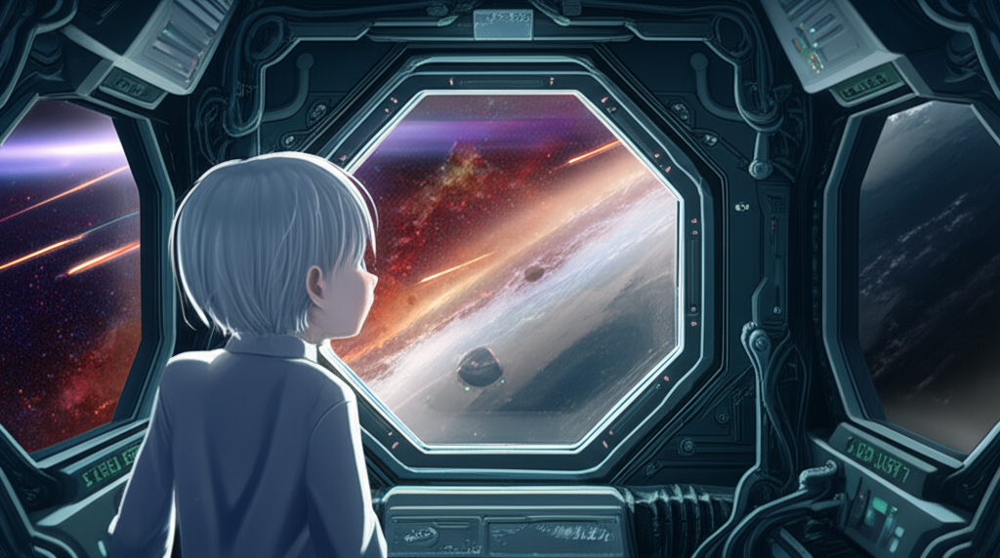

In [ ]:
prompt = response_cerita.text

response = client.models.generate_content(
    model="gemini-2.0-flash-exp",
    contents=prompt,
    config=types.GenerateContentConfig(
        response_modalities=['Text', 'Image'],
        seed=42
    )
)

for part in response.candidates[0].content.parts:
  if part.text is not None:
    display(Markdown(part.text))
  elif part.inline_data is not None:
    mime = part.inline_data.mime_type
    print(mime)
    data = part.inline_data.data
    display(Image(data=data))

In [ ]:
print("Usage Metadata:")
usage_metadata = response.usage_metadata
for key, value in usage_metadata.__dict__.items():
  print(f"- {key}: {value}")

Usage Metadata:
- cache_tokens_details: None
- cached_content_token_count: None
- candidates_token_count: 1394
- candidates_tokens_details: [ModalityTokenCount(modality=<MediaModality.IMAGE: 'IMAGE'>, token_count=1290)]
- prompt_token_count: 178
- prompt_tokens_details: [ModalityTokenCount(modality=<MediaModality.TEXT: 'TEXT'>, token_count=178)]
- thoughts_token_count: None
- tool_use_prompt_token_count: None
- tool_use_prompt_tokens_details: None
- total_token_count: 1572
- traffic_type: None


## Generate Image to Image

In [ ]:
!pip install diffusers transformers torch --quiet
!pip install peft --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 123.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 100.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 51.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 42.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 101.0 MB/s eta 0:00:00


In [ ]:
import matplotlib.pyplot as plt

def display_image_side_to_side(init_image, generated_image):
  plt.subplot(1, 2, 1)
  plt.imshow(init_image)
  plt.title("Original Image")
  plt.axis('off')

  plt.subplot(1, 2, 2)
  plt.imshow(generated_image)
  plt.title("Generated Image")
  plt.axis('off')

  plt.show()

In [ ]:
import torch
from PIL import Image

from diffusers import StableDiffusionXLImg2ImgPipeline

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.71k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`
Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`
Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/4.52G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

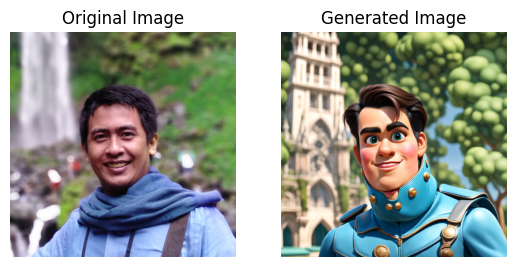

In [ ]:
download_url = f"https://drive.google.com/uc?id=1dvSMVMphp-Sn9CU3eQZ-pkI9kCHMbjbX&export=download"
output_filename = "profile.jpg"

# Perintah wget untuk mengunduh file
wget_command = f"wget --no-check-certificate '{download_url}' -O '{output_filename}'"
os.system(wget_command)

init_image = PILImage.open(output_filename)

pipe = StableDiffusionXLImg2ImgPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)
pipe = pipe.to("cuda")

seed = 42
generator = torch.manual_seed(seed)
prompt = "Create Disney studio character"
negative_prompt = 'nsfw, low resolution'

width = 1024
height = int(init_image.height * (width / init_image.width))
init_image = init_image.resize((width, height))

image = pipe(prompt, image=init_image, negative_prompt = negative_prompt, strength=0.75, guidance_scale=15, steps = 2000, generator = generator).images
display_image_side_to_side(init_image, image[0])

# Selesai

Mohon feedbacknya:
https://docs.google.com/forms/d/e/1FAIpQLSeUovhg6kGn2_k6_sMsuqEyQxGqDWpkc-8xBQotrI-5IiraQg/viewform?usp=sf_link

<center><img src="https://drive.google.com/uc?id=1Vexz_KfVKrF1U-s2D3axwjcb3TqoDj4W" width="300" style="float:right;">
</center>